# TP 2 : Keypoint Detection and Matching

Complete the following notebook and upload the ipynb file. You may need to add cells to write your code and comments. 

The first part is about basic image processing in Python, the second guides you in the implementation of the Harris corner detector.

## 1. Basic image processing in Python
Here are a set of useful libraries for image processing. You will need to refer to the online documentation of the different libraries to complete the TP.


In [1]:
import cv2 # OpenCV
import numpy as np
import matplotlib.pyplot as plt

# To see the images in a notebook:
%matplotlib inline

## Downloading an image


In [2]:
# On Colab, for downloading an image, first do:
#!wget "http://imagine.enpc.fr/~lepetitv/triva/mini_graffiti1.png"
#!ls

# With or without Colab, then:
graffiti = plt.imread('mini_graffiti1.png')

## Visualizing an image

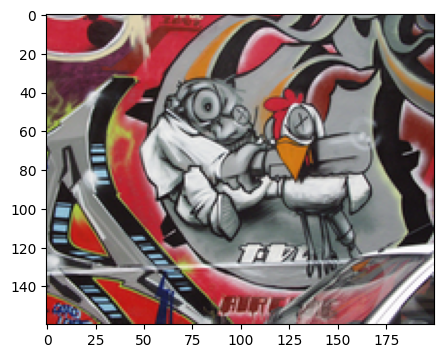

In [3]:
# Not necessary, but let you control the size of the image:
figsize = 5
plt.figure(figsize=(figsize,figsize))

# Actually show the image
plt.imshow(graffiti)

1.a What is the size of the image? The type of the values it contains? The range of the values? [hint: look for numpy attributes e.g. at https://docs.scipy.org/doc/numpy/reference/arrays.ndarray.html]

In [4]:
h, w, c= graffiti.shape
print(f"hauteur : {h}  largeur : {w}  channel : {c}")

#type de données 
print(graffiti.dtype)

#Valeur min et val max
print(graffiti.min(), graffiti.max())


hauteur : 160  largeur : 200  channel : 3
float32
0.0 1.0


L'image a une taille de 160x200 pixels et 3 canaux. Le type des données est float32 donc des floats stockés sous 32 bits. Il y a donc un total de 96000 valeur dans l'image (160x200x3). Les valeurs des pixels sont das l'ntervalle [0, 1] donc les valeurs ont été normalisées 

## Converting the image to grayscale

1.b Convert the graffiti image to grayscale using the formula L=0.2989 R + 0.5870 G + 0.1140 * B,  where R, G and B are the three color channels of the color image and L is the luminance (i.e. the grayscale image). Visualize the result.

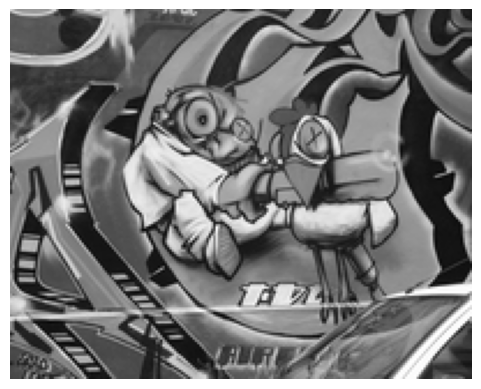

In [5]:
L = 0.2989 * graffiti[:, :, 0] + 0.5870 * graffiti[:, :, 1] + 0.1140 * graffiti[:, :, 2]

plt.imshow(L, cmap="gray")
plt.axis("off")
plt.show()

## Adding Gaussian noise

1.c Create a new image by adding Gaussian noise of standard deviation 0.1 to the graffiti image and visualize the result. [hint: numpy.random.normal]

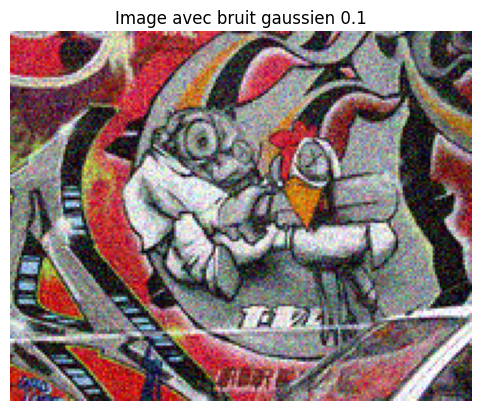

In [6]:
sigma = 0.1
noise = np.random.normal(0, sigma, graffiti.shape)
noisy = graffiti + noise

#on reste entre 0 et 1
noisy = np.clip(noisy, 0, 1)

plt.imshow(noisy)
plt.axis("off")
plt.title("Image avec bruit gaussien 0.1")
plt.show()

## Convolution

1.d Blur the noisy image with a Gaussian kernel of standard deviation 1.0 and visualize the result. [hint: cv2.GaussianBlur]

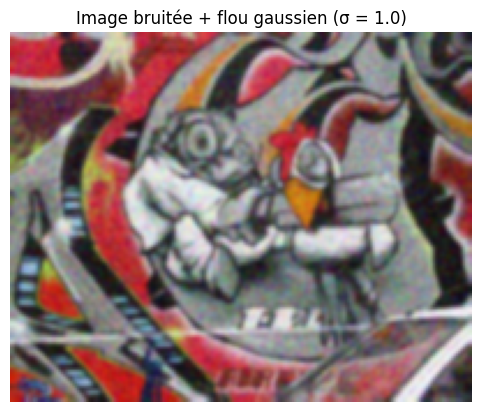

In [7]:
sigma = 1.0

blurred = cv2.GaussianBlur(noisy, (0, 0), sigma)

plt.imshow(blurred)
plt.axis("off")
plt.title("Image bruitée + flou gaussien (σ = 1.0)")
plt.show()

## Convolution (2)

1.e Convolve the original graffiti image (ie before adding noise) with filter:
```
+1 0 -1
+2 0 -2
+1 0 -1
```
[hint: ```np.array``` and ```cv2.filter2D```]

Visualize the result.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.435294..3.1137254].


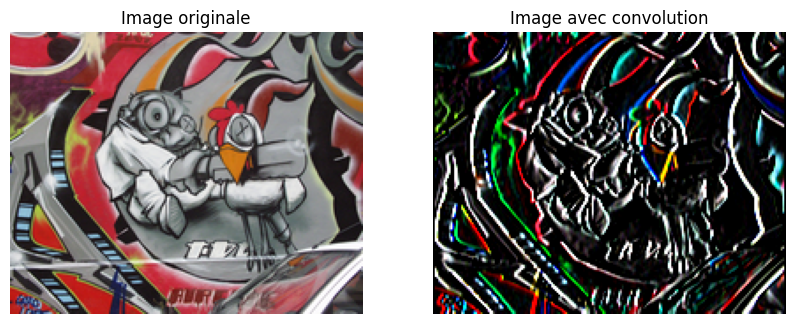

In [8]:
kernel = np.array([
    [1, 0, -1],
    [2 ,0, -2],
    [1, 0, -1]
], dtype=np.float32)

filtered = cv2.filter2D(graffiti, -1, kernel)

plt.figure(figsize=(10,4))

plt.subplot(1,2,1)
plt.imshow(graffiti)
plt.title("Image originale")
plt.axis("off")

plt.subplot(1,2,2)
plt.imshow(filtered)
plt.title("Image avec convolution")
plt.axis("off")

plt.show()



Le filtre utilisé permet de mettre en évidence les variations d'intensité gauche droite et donc les contours verticaux de l'image. Les zones ou l'intensité varie peu restent noires et sinon les contour apparaissent

# 2. Harris corner detector

We will now implement the Harris corner detector as seen during Lecture #2, and apply it to the graffiti image.

You cannot use the ```harrisCorner``` function from OpenCV.

## Image gradients

2.a You first need to compute the image gradients. You cannot use the ```Sobel``` function. [hint: What does the filter of Question 1.e do?]

(Attention: with the ```imshow``` function alone, you can display only one image. See code right below to show the 2 image gradients together.)

In [10]:
gray = cv2.cvtColor(graffiti, cv2.COLOR_RGB2GRAY)

kernel_x = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
], dtype=np.float32)

kernel_y = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
], dtype=np.float32)

# gradients
Ix = cv2.filter2D(gray, -1, kernel_x)
Iy = cv2.filter2D(gray, -1, kernel_y)

# normalisation
Ix_disp = (Ix - Ix.min()) / (Ix.max() - Ix.min())
Iy_disp = (Iy - Iy.min()) / (Iy.max() - Iy.min())

To visualize the two gradient images together, you can do:

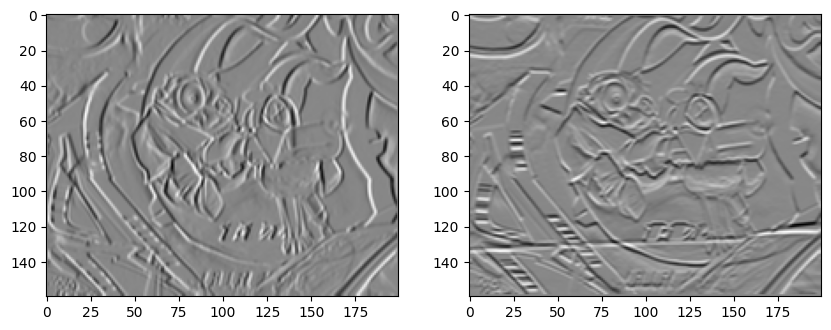

In [11]:
fig = plt.figure(figsize=(10, 5))
fig.add_subplot(1, 2, 1)
plt.imshow(Ix_disp, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(Iy_disp, cmap='gray')
plt.show()

Le filtre de la question 1.e calcule le gradient selon la direction x (horizontale). Ce filtre met en évidence les variations d’intensité selon l’axe horizontal et permet de détecter les contours verticaux. En prenant sa transposée on obtient le filtre qui calcule le gradient selan la direction y. Ce filtre met en évidence les variations d’intensité selon l’axe vertical et permet de détecter les contours horizontaux.

2.b Compute the images $I_x^2$, $I_y^2$, and $I_x I_y$. Visualize the results. 

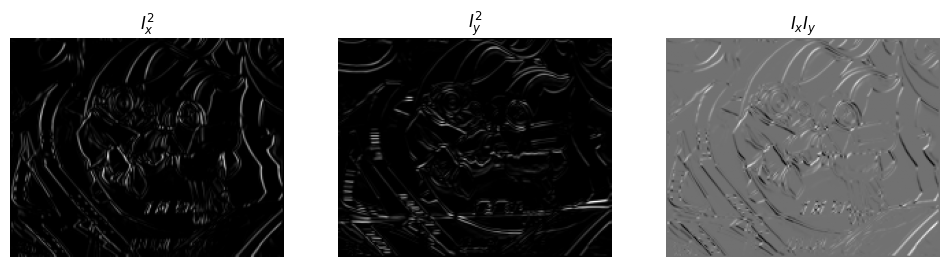

In [12]:
Ix2 = Ix ** 2
Iy2 = Iy ** 2
Ixy = Ix * Iy

# normalisation
Ix2_disp = (Ix2 - Ix2.min()) / (Ix2.max() - Ix2.min())
Iy2_disp = (Iy2 - Iy2.min()) / (Iy2.max() - Iy2.min())
Ixy_disp = (Ixy - Ixy.min()) / (Ixy.max() - Ixy.min())

plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(Ix2_disp, cmap='gray')
plt.title(r"$I_x^2$")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(Iy2_disp, cmap='gray')
plt.title(r"$I_y^2$")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(Ixy_disp, cmap='gray')
plt.title(r"$I_x I_y$")
plt.axis("off")

plt.show()

Les images obtenues correspondent aux termes $I_x^2$, $I_y^2$​ et $I_x I_y$, calculés à partir des gradients de l’image.

Les images $I_x^2$ et $I_y^2$
mettent en évidence les zones où les gradients sont forts dans une seule direction. Ainsi, $I_x^2$ fait ressortir principalement les contours verticaux, tandis que 
$I_y^2$ met en évidence les contours horizontaux. Ces images apparaissent globalement sombres, car la majorité des pixels ont des gradients faibles, et seules les zones de variation importante sont visibles.

L’image $I_x I_y$ représente la corrélation entre les gradients horizontal et vertical. Elle met en évidence les zones où les variations d’intensité sont présentes dans les deux directions simultanément.

2.c Apply Gaussian blur of standard deviation 1.0 to $I_x^2$, $I_y^2$, $I_x I_y$. Visualize the results.

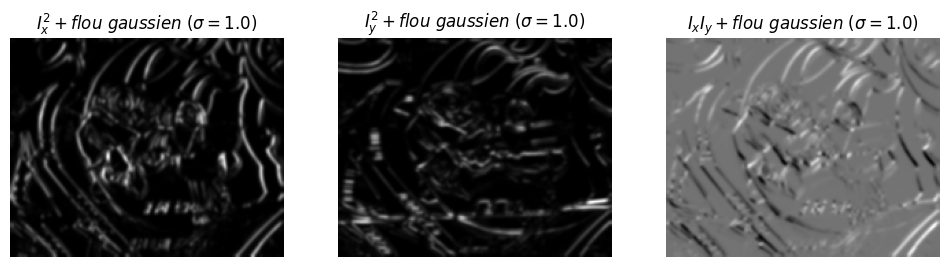

In [13]:
sigma = 1.0

Ix2_blurred = cv2.GaussianBlur(Ix2, (0, 0), sigma)
Iy2_blurred = cv2.GaussianBlur(Iy2, (0, 0), sigma)
Ixy_blurred = cv2.GaussianBlur(Ixy, (0, 0), sigma)

# normalisation
Ix2_disp = (Ix2_blurred - Ix2_blurred.min()) / (Ix2_blurred.max() - Ix2_blurred.min())
Iy2_disp = (Iy2_blurred - Iy2_blurred.min()) / (Iy2_blurred.max() - Iy2_blurred.min())
Ixy_disp = (Ixy_blurred - Ixy_blurred.min()) / (Ixy_blurred.max() - Ixy_blurred.min())

# affichage
plt.figure(figsize=(12,4))

plt.subplot(1,3,1)
plt.imshow(Ix2_disp, cmap='gray')
plt.title(r"$I_x^2 + flou\ gaussien\ (\sigma = 1.0)$")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(Iy2_disp, cmap='gray')
plt.title(r"$I_y^2 + flou\ gaussien\ (\sigma = 1.0)$")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(Ixy_disp, cmap='gray')
plt.title(r"$I_x I_y + flou\ gaussien\ (\sigma = 1.0)$")
plt.axis("off")

plt.show()

Les contours apparaisent mieux. Le flou gaussien permet de lisser les variations locales et de rendre les structures plus continues.

2.d Compute the Harris score map, using the formula $\text{det}\;Q - 0.04 \; (\text{tr}\;Q)^2$.  This formula is often used to approximate the smallest eigenvalue or the ratio of the determinant and the trace, as it is faster to compute.

Visualize the result.

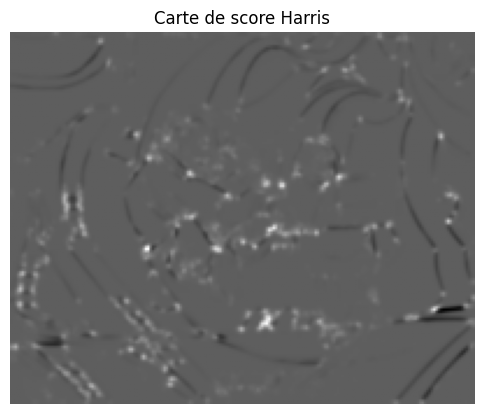

In [14]:
detQ = Ix2_blurred * Iy2_blurred - Ixy_blurred**2
trQ = Ix2_blurred + Iy2_blurred

R = detQ - 0.04 * (trQ)**2

# normalisation
R_disp = (R - R.min()) / (R.max() - R.min())

plt.figure(figsize=(6,6))
plt.imshow(R_disp, cmap='gray')
plt.title("Carte de score Harris")
plt.axis("off")
plt.show()

2.e Find the local maxima of the score map to create a list of interest points. You can keep only the local maxima with a score higher than some threshold (I used 0.5) to avoid having to many points. 

In [15]:
threshold = 0.5
R_thresh = R_disp > threshold

corners = np.zeros_like(R_disp, dtype=bool)

for i in range(1, R_disp.shape[0]-1):
    for j in range(1, R_disp.shape[1]-1):
        patch = R_disp[i-1:i+2, j-1:j+2]
        if R_disp[i, j] > threshold and R_disp[i, j] == np.max(patch):
            corners[i, j] = True

ys, xs = np.where(corners)
points = list(zip(xs, ys))

To visualize the points you detected, you can use the following code.  It assumes that the detected points are in the ```points``` list, and each element is a point represented by a 2D array containing its x and y coordinates.

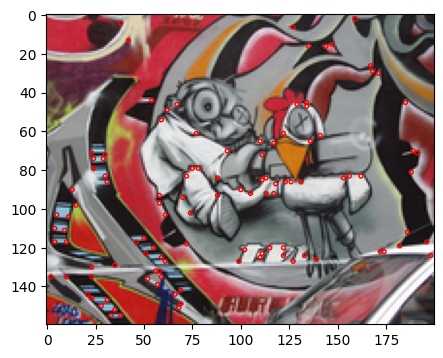

In [16]:
import matplotlib.patches as patches

fig, ax = plt.subplots(figsize=(5, 5))
ax.imshow(graffiti,cmap='gray')

for p in points:
  pt = patches.Circle((p[0], p[1]), radius = 1, edgecolor = 'r', fill = False)
  ax.add_patch(pt)

plt.show()


Les points détectés correspondent bien aux zones où les variations d’intensité sont fortes dans les deux directions (coins).

## ```detect_harris_points``` Function

Create a function ```detect_harris_points``` using your code above.  Your function should take as input a grayscale image, the standard deviation of the Gaussian filter that is applied to the products of image derivatives, and the threshold applied to the Harris score to keep a point or not.

The function should return a list of points. Each point should stored as an array of 3 values: its x and y coordinates and its Harris score.

In [17]:
def detect_harris_points(image: np.ndarray, sigma: float, threshold: float) -> list:
    """
    Detect Harris interest points in a grayscale image.
    """

    kernel_x = np.array([
        [1, 0, -1],
        [2, 0, -2],
        [1, 0, -1]
    ], dtype=np.float32)

    kernel_y = np.array([
        [1,  2,  1],
        [0,  0,  0],
        [-1, -2, -1]
    ], dtype=np.float32)

    # Gradients
    Ix = cv2.filter2D(image.astype(np.float32), -1, kernel_x)
    Iy = cv2.filter2D(image.astype(np.float32), -1, kernel_y)

    Ix2 = Ix ** 2
    Iy2 = Iy ** 2
    Ixy = Ix * Iy

    # Bruit Gaussien
    Ix2_blurred = cv2.GaussianBlur(Ix2, (0, 0), sigma)
    Iy2_blurred = cv2.GaussianBlur(Iy2, (0, 0), sigma)
    Ixy_blurred = cv2.GaussianBlur(Ixy, (0, 0), sigma)

    # Score Harris
    detQ = Ix2_blurred * Iy2_blurred - Ixy_blurred ** 2
    trQ = Ix2_blurred + Iy2_blurred
    R = detQ - 0.04 * (trQ)**2

    # Max local et seuil
    points = []
    for y in range(1, R.shape[0] - 1):
        for x in range(1, R.shape[1] - 1):
            patch = R[y-1:y+2, x-1:x+2]
            if R[y, x] > threshold and R[y, x] == np.max(patch):
                points.append(np.array([x, y, R[y, x]]))

    return points

# 3. Keypoint matching

In [18]:
import cv2 # OpenCV
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# To see the images in a notebook:
%matplotlib inline

In [19]:
#!wget "http://imagine.enpc.fr/~lepetitv/triva/asterix1.png"
#!wget "http://imagine.enpc.fr/~lepetitv/triva/asterix2.png"
#!ls

# With or without Colab, then:
img = plt.imread('asterix1.png')
I1 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = plt.imread('asterix2.png')
I2 = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

Visualizing the images...

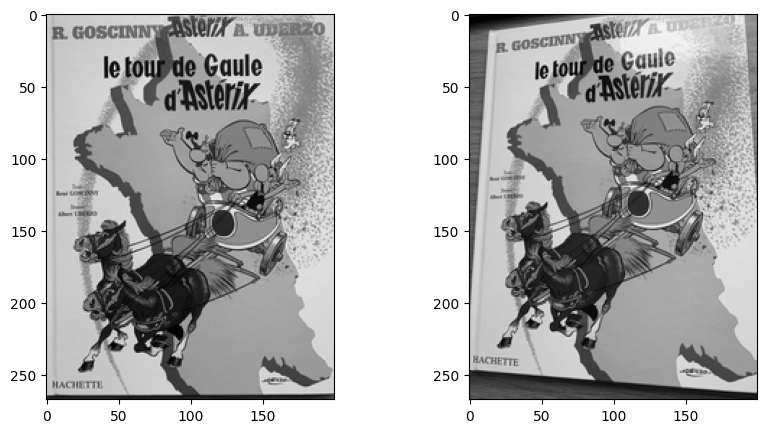

In [20]:
# Not necessary, but let you control the size of the image:
figsize = 5
fig = plt.figure(figsize=(2*figsize,figsize))
# Actually show the image
fig.add_subplot(1, 2, 1)
plt.imshow(I1, cmap='gray')
fig.add_subplot(1, 2, 2)
plt.imshow(I2, cmap='gray')
plt.show()

Call your function on ```I1``` and ```I2``` using a standard deviation of 1.0 and a threshold of 0.5 (for example), to get two arrays ```points1``` and ```points2```:

In [21]:
P1 = detect_harris_points(I1, 1.0, 0.5)
P2 = detect_harris_points(I2, 1.0, 0.5)

Use the code below to visualize the results. Do the points look more or less the same in the two images?  If not, your ```detect_harris_points``` function is incorrect.

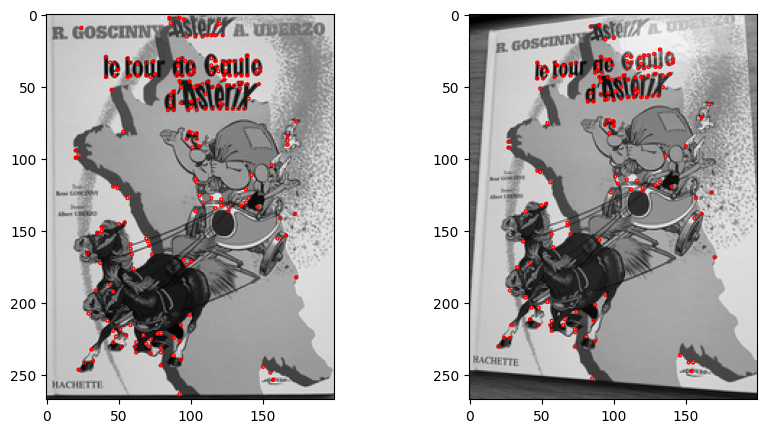

In [22]:
def show_img_and_points(ax, image, points):
  ax.imshow(image, cmap='gray')
  for p in points:
    pt = patches.Circle((p[0], p[1]), radius = 1, edgecolor = 'r', fill = False)
    ax.add_patch(pt)

fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10, 5))
show_img_and_points(ax1, I1, P1)
show_img_and_points(ax2, I2, P2)
plt.show()


If you do not see more or less the same points in the images, then your function is not correct. Fix it :)

Je vois les mêmes points ça me semble pas trop mal

## ```extract_descriptors``` Function

Write a function called ```extract_descriptors```. This function should take as input an image, and a list of points as returned by the ```detect_harris_points``` function. This function should return a list of descriptors. Each descriptor should be coded as a numpy array. 

We will use very simple descriptors: The descriptor of a Harris point will be made of the 7x7 intensity values around this point.

(If you do not like having separated arrays for the points and their descriptors, you can create a class ```Point``` that stores both the point coordinates and its descriptor. However, don't forget that the priority for this TP is to have code that works well.)


In [23]:
def extract_descriptors(image, points):
    descriptors = []
    half = 3

    for p in points:
        x, y = int(p[0]), int(p[1])

        # On vérifie que le patch ne sort pas de l'image
        if y - half < 0 or y + half + 1 > image.shape[0] or \
           x - half < 0 or x + half + 1 > image.shape[1]:
            descriptors.append(None)
            continue

        patch = image[y - half : y + half + 1,
                      x - half : x + half + 1]
        descriptors.append(patch.flatten())

    return descriptors


Calling the ```extract_descriptors``` for the 2 images:

In [24]:
D1 = extract_descriptors(I1, P1)
D2 = extract_descriptors(I2, P2)

## 4. ```match_V1``` Function

Write a first function ```match_V1``` for matching two sets of points based on their descriptors. This function should take as input a first list of points, the list of their descriptors, a second list of points, and the list of their descriptors. It should return a list of matches, each match represented as an array of the indices of two matching points.

A point $p_1$ in the first image should be matched with the point $p_2$ in the second image with the smallest distance in the descriptor space. In other words, $p1$ should be matched with
$$
\arg \min_{p_2 \in P_2} \|desc(p_1) - desc(p_2)\| \> ,
$$
where $P_2$ is the set of points detected in the second image, and $desc(p)$ is the descriptor of point $p$.


In [25]:
# This version actually does not use points1 and points2 but the next version will:

def match_V1(points1, descriptors1, points2, descriptors2):
  matches = list()

  for i, d1 in enumerate(descriptors1):
        if d1 is None:
            continue

        best_j = -1
        best_dist = float('inf')

        for j, d2 in enumerate(descriptors2):
            if d2 is None:
                continue
            dist = np.linalg.norm(d1 - d2)
            if dist < best_dist:
                best_dist = dist
                best_j = j

        if best_j != -1:
            matches.append(np.array([i, best_j]))

  return matches


Run the code below to visualize the result of the ```match``` function.

The matches can look wrong at first sight but the function can still be correct! Some points are difficult to match, resulting in mistakes at this stage, and others are easier and are already correctly matched. With my code, I got 3 points on the Uderzo signature (bottom right) that are all correctly matched.

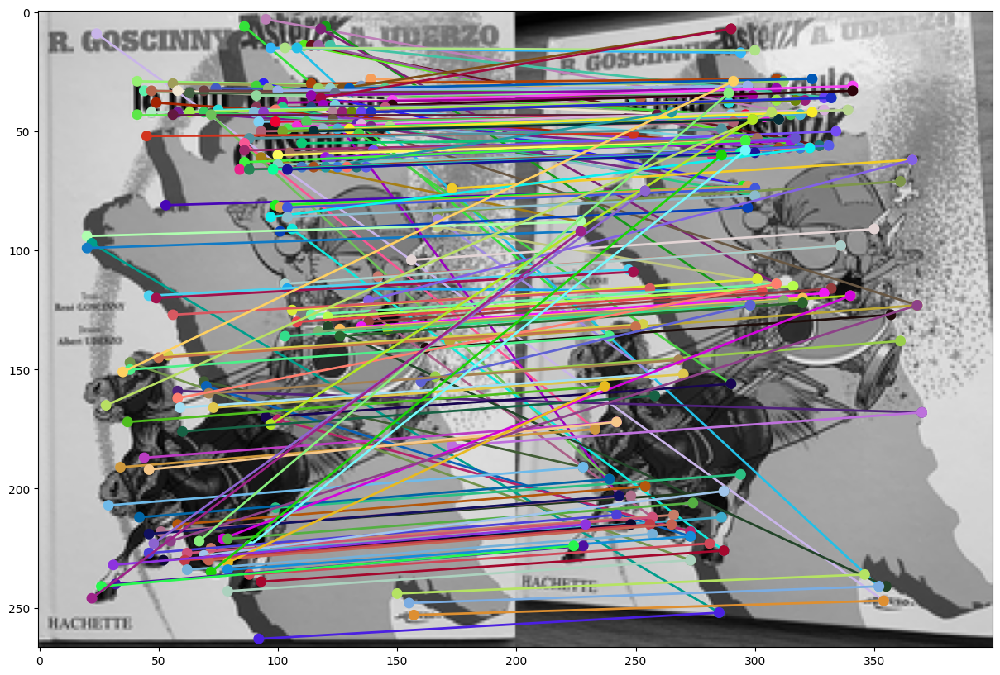

In [26]:
def show_matches(image1, image2, matches, points1, points2):
  pair = np.hstack((image1, image2))
  fig, ax = plt.subplots(figsize=(20, 10))
  ax.imshow(pair, cmap='gray')
  for m in matches:
    p1 = points1[m[0]][0:2].copy()
    p2 = points2[m[1]][0:2].copy()
    p2[0] = p2[0] + image1.shape[1]
    line = np.array([p1, p2])
    rc = np.random.uniform(0.0, 1.0, 3)
    pt = patches.Polygon(line, color = rc, lw = 2.0)
    ax.add_patch(pt)
    pt = patches.Circle(p1, radius = 2, color = rc, fill = True)
    ax.add_patch(pt)
    pt = patches.Circle(p2, radius = 2, color = rc, fill = True)
    ax.add_patch(pt)
  plt.show()    
  
M = match_V1(P1, D1, P2, D2)
show_matches(I1, I2, M, P1, P2)

Ça me semble cohérent avec la description du prof. Le rajout du .copy dans show_matches() a permis de régler les bugs

## 5. ```match_V2``` function

Write an improved version of the ```match``` function. This function should look for the correspondent of $p_1$ only in a region centered on $p_1$. I used a region of size 40x40.

In [27]:
def match_V2(points1, descriptors1, points2, descriptors2):
  matches = list()

  for i, d1 in enumerate(descriptors1):
      if d1 is None:
          continue

      best_j = -1
      best_dist = float('inf')

      x1, y1 = points1[i][0], points1[i][1]

      for j, d2 in enumerate(descriptors2):
          if d2 is None:
              continue

          x2, y2 = points2[j][0], points2[j][1]

          # On cherche seulement dans une région 40x40
          if abs(x2 - x1) > 20 or abs(y2 - y1) > 20:
              continue

          dist = np.linalg.norm(d1 - d2)
          if dist < best_dist:
              best_dist = dist
              best_j = j

      if best_j != -1:
          matches.append(np.array([i, best_j]))

  return matches

To test your function:

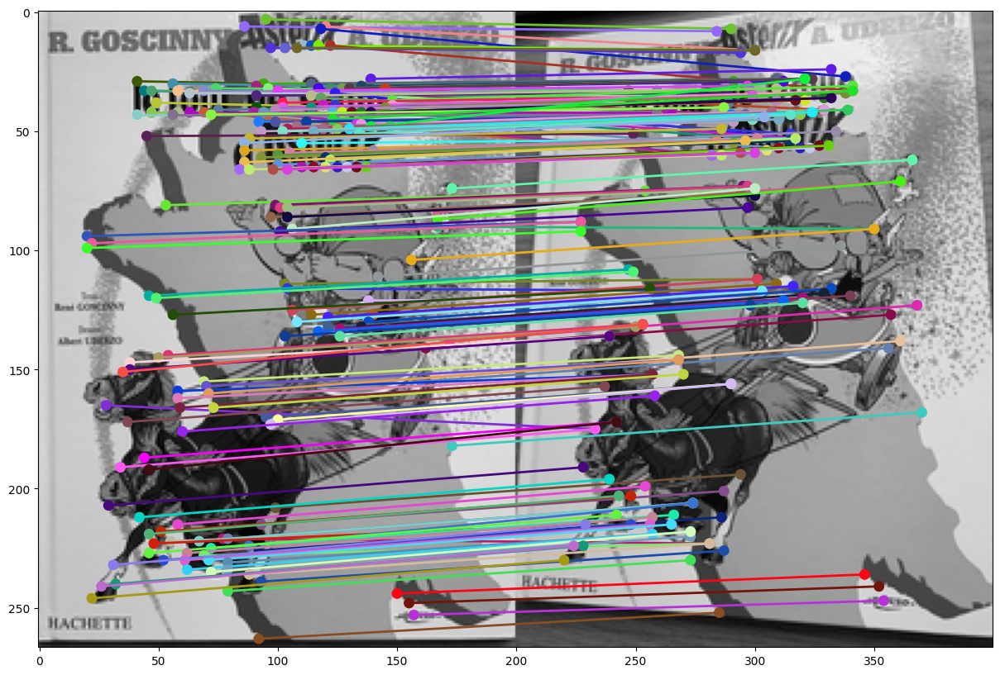

In [28]:
M = match_V2(P1, D1, P2, D2)
show_matches(I1, I2, M, P1, P2)

Cette fonction améliore les résultats. Comparé à V1, on a plus de points correctement associés, en effet la zone restreinte permet de mieux faire correspondre p1.

## 6. ```match_V3``` function

Write an even improved version of the ```match``` function. This function should keep matches only if the 2 points "chose" each other (see material for Lecture #2).

With this version, I get only 2 incorrect matches.

In [29]:
#J'ai pris la liberté de rajouter un paramètre region qui permet de modifier 
# le paramètre pour la partie 7
def match_V3(points1, descriptors1, points2, descriptors2, region): 
  matches = list()

  # Pour chaque point de P1, trouver le meilleur dans P2
  def best_match(desc_a, points_a, i, desc_b, points_b):
      best_j = -1
      best_dist = float('inf')
      xa, ya = points_a[i][0], points_a[i][1]
      for j, db in enumerate(desc_b):
          if db is None:
              continue
          xb, yb = points_b[j][0], points_b[j][1]
          if abs(xb - xa) > region or abs(yb - ya) > region:
              continue
          dist = np.linalg.norm(desc_a[i] - db)
          if dist < best_dist:
              best_dist = dist
              best_j = j
      return best_j

  for i, d1 in enumerate(descriptors1):
      if d1 is None:
          continue

      # P1[i] choisit P2[j]
      j = best_match(descriptors1, points1, i, descriptors2, points2)
      if j == -1:
          continue

      # P2[j] choisit P1[k]
      k = best_match(descriptors2, points2, j, descriptors1, points1)

      if k == i:  # ils se choisissent mutuellement
          matches.append(np.array([i, j]))

  return matches


To test your function:

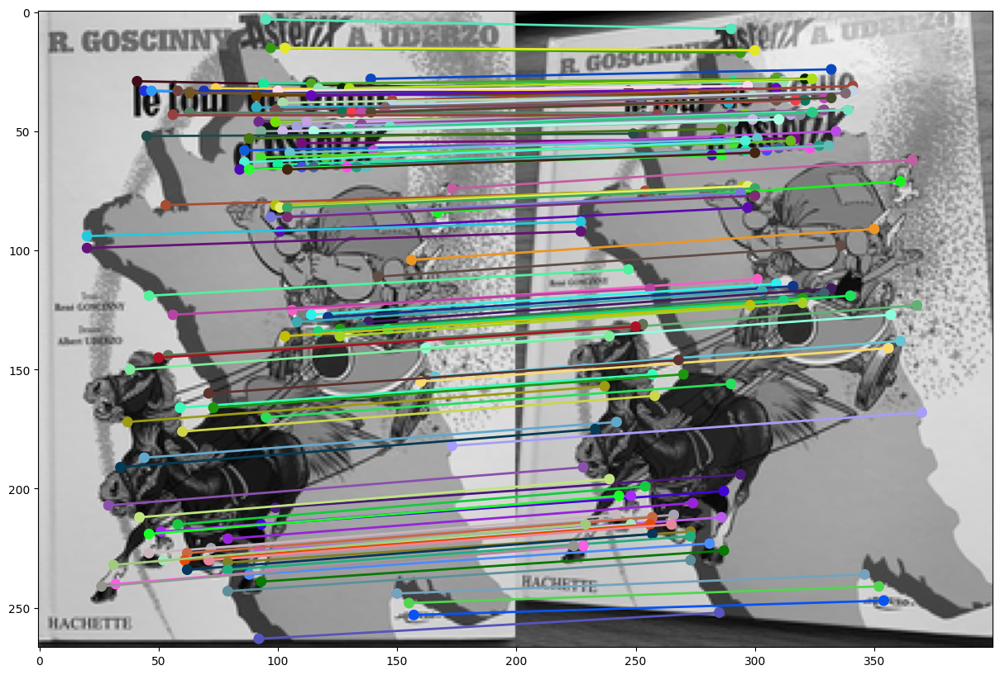

In [30]:
M = match_V3(P1, D1, P2, D2, region=20)
show_matches(I1, I2, M, P1, P2)

Match v3 améliore considérablement les résultats, tous les points matchent correctement.

## 7. Challenge

Load these new images:

In [39]:
import os

for i in range(8):
  url = "http://imagine.enpc.fr/~lepetitv/triva/vangogh%d.png" % i
  os.system('wget %s' % url)

--2026-03-26 18:45:16--  http://imagine.enpc.fr/~lepetitv/triva/vangogh0.png
Resolving imagine.enpc.fr (imagine.enpc.fr)... 195.221.193.65
Connecting to imagine.enpc.fr (imagine.enpc.fr)|195.221.193.65|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 392930 (384K) [image/png]
Saving to: ‘vangogh0.png.2’

     0K .......... .......... .......... .......... .......... 13% 1.82M 0s
    50K .......... .......... .......... .......... .......... 26% 4.39M 0s
   100K .......... .......... .......... .......... .......... 39% 10.3M 0s
   150K .......... .......... .......... .......... .......... 52% 20.0M 0s
   200K .......... .......... .......... .......... .......... 65% 4.47M 0s
   250K .......... .......... .......... .......... .......... 78% 23.2M 0s
   300K .......... .......... .......... .......... .......... 91% 15.0M 0s
   350K .......... .......... .......... ...                  100%  674K=0.06s

2026-03-26 18:45:16 (6.10 MB/s) - ‘vangogh0.png.2’ saved [

In [40]:
vangogh = []
for i in range(8):
  filename = "vangogh%d.png" % i
  img = plt.imread(filename)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  vangogh.append(img)

You can visualize these images by calling the function below.

In [41]:
def show_vangogh(rectangles = None):
  GT = [
      [[100,210], [394,424]],
      [[ 40,182], [327,391]],
      [[ 53, 95], [326,290]],
      [[ 74,163], [352,367]],
      [[ 81,121], [364,325]],
      [[ 99,107], [360,288]],
      [[132,346], [401,546]],
      [[123,329], [426,551]]
  ]
  fig, axes = plt.subplots(2,4, figsize=(20, 10))
  if rectangles != None:
    print("%d pose(s) provided" % len(rectangles))
  n = 0
  for i in range(2):
    for j in range(4):
      axes[i][j].imshow(vangogh[n], cmap='gray')
      if n < len(GT):
        pt = patches.Rectangle(GT[n][0], GT[n][1][0] - GT[n][0][0], GT[n][1][1] - GT[n][0][1], fill = False, ec = 'red')
        axes[i][j].add_patch(pt)
      if rectangles != None and n > 0 and n-1 < len(rectangles):
        pt = patches.Rectangle(rectangles[n-1][0], rectangles[n-1][1][0] - rectangles[n-1][0][0], rectangles[n-1][1][1] - rectangles[n-1][0][1], fill = False, ec = 'blue')
        axes[i][j].add_patch(pt)
        error = np.linalg.norm(np.array(rectangles[n-1][0]) - np.array(GT[n][0]))
        error += np.linalg.norm(np.array(rectangles[n-1][1]) - np.array(GT[n][1]))
        print("Error for image %d: %f" % (n, error))
      n = n + 1
  plt.show()

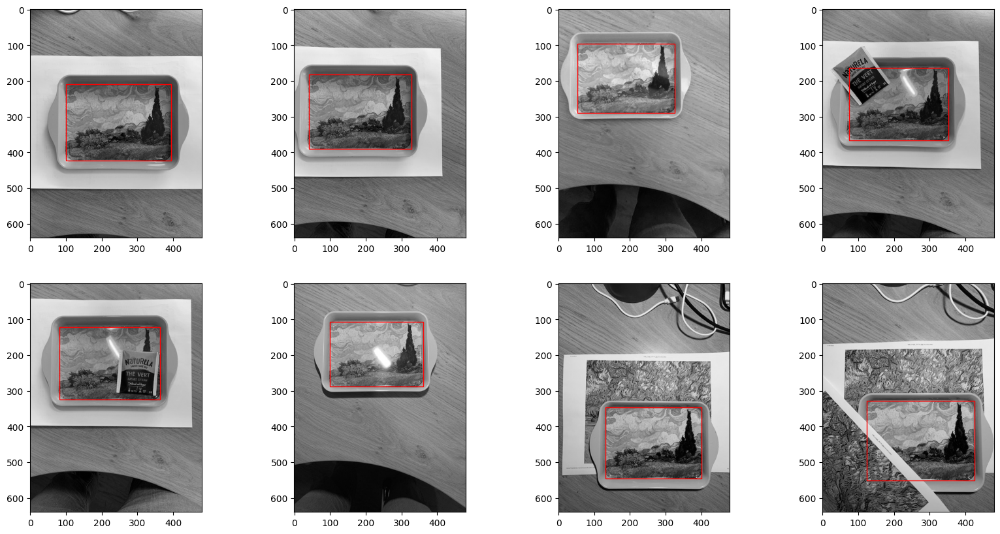

In [42]:
show_vangogh()

We want to retrieve the reproduction of the painting in all the images. 

Let's assume we know the reproduction is in the rectangle [[100,210], [394,424]] (the x,y coordinates of the top-left corner, followed by the x,y coordinates of the bottom-right corner) in the first image. Use your ```match_V3``` function to find matches between the first and second images. Can you imagine a method to find the corners of the reproduction in the second image from these matches?

You can check your results by calling the function with the rectangle as argument:

```show_vangogh([[[x_TL,y_TL], [x_BR,y_BR]]])```

(be careful, the parameter is a 3-array: an array of an array of 2d points)

1 pose(s) provided
Error for image 1: 8.659379


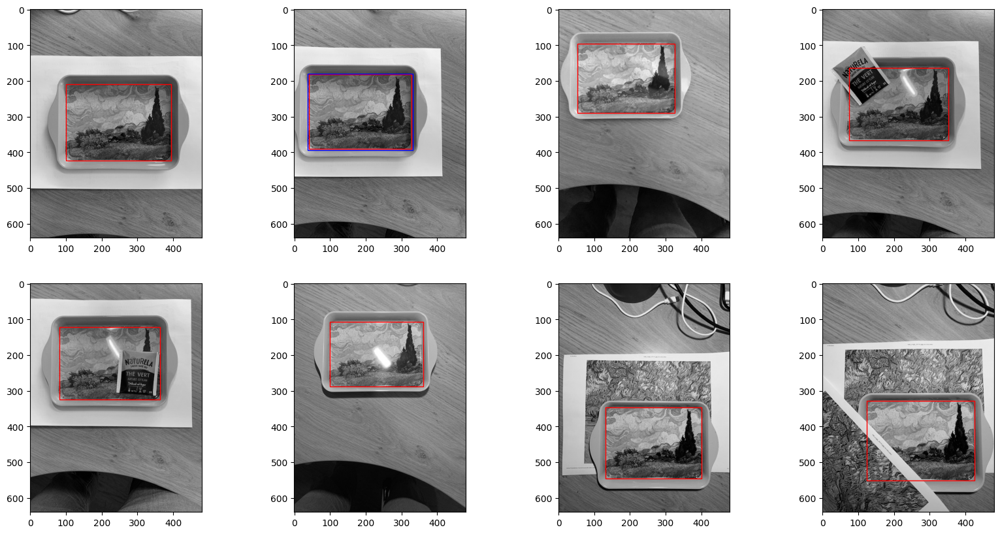

In [43]:
# Images et détection
P0 = detect_harris_points(vangogh[0], 1.0, 0.0007)
P1v = detect_harris_points(vangogh[1], 1.0, 0.0007)
D0 = extract_descriptors(vangogh[0], P0)
D1v = extract_descriptors(vangogh[1], P1v)

# Matches entre image 0 et image 1
M01 = match_V3(P0, D0, P1v, D1v, 70)

# Rectangle connu dans vangogh[0]
rect0_TL = [100, 210]
rect0_BR = [394, 424]

# Garder seulement les matches dont le point source est dans le rectangle
inside = []
for m in M01:
    x, y = P0[m[0]][0], P0[m[0]][1]
    if rect0_TL[0] <= x <= rect0_BR[0] and rect0_TL[1] <= y <= rect0_BR[1]:
        inside.append(m)

# Déplacement médian
dx = np.median([P1v[m[1]][0] - P0[m[0]][0] for m in inside])
dy = np.median([P1v[m[1]][1] - P0[m[0]][1] for m in inside])

rect1_TL = [int(rect0_TL[0] + dx), int(rect0_TL[1] + dy)]
rect1_BR = [int(rect0_BR[0] + dx), int(rect0_BR[1] + dy)]

show_vangogh([[rect1_TL, rect1_BR]])


On obtient un rectangle qui matche à peu près avec une erreur de 8.65. Le fait de changer le paramètre région de 20 à 70 a drastiquement changé les résultats, passant d'une erreur de 129.67 à 8.65.

Can you imagine a method to retrieve the positions of the reproduction in all the images?  Implement it!  How well does it perform?

7 pose(s) provided
Error for image 1: 8.659379
Error for image 2: 29.969353
Error for image 3: 19.321704
Error for image 4: 15.264933
Error for image 5: 113.565218
Error for image 6: 29.265012
Error for image 7: 12.211103


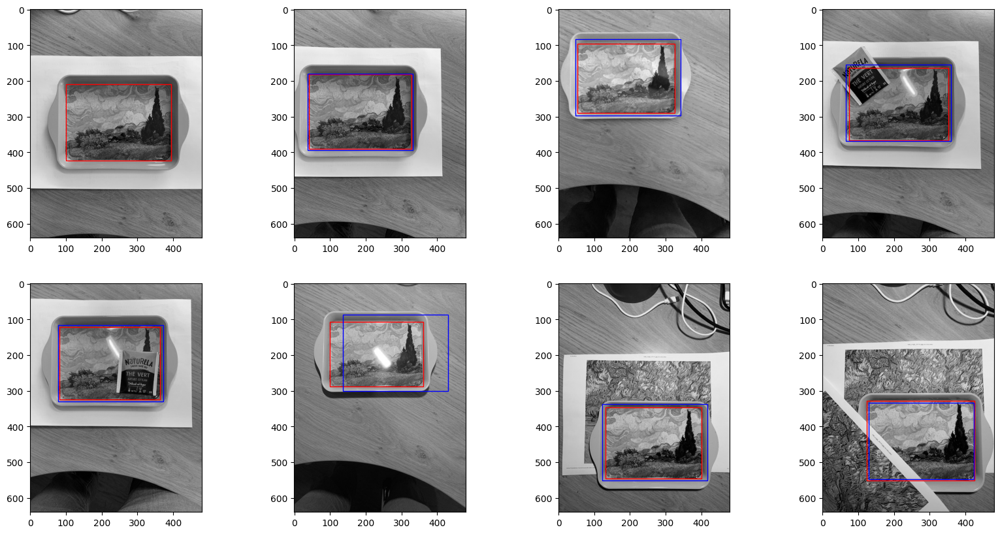

In [44]:
rect0_TL = [100, 210]
rect0_BR = [394, 424]

P0 = detect_harris_points(vangogh[0], 1.0, 0.0005)
D0 = extract_descriptors(vangogh[0], P0)

rectangles = []

for n in range(1, 8):
    Pn = detect_harris_points(vangogh[n], 1.0, 0.0005)
    Dn = extract_descriptors(vangogh[n], Pn)
    Mn = match_V1(P0, D0, Pn, Dn)

    inside = []
    for m in Mn:
        x, y = P0[m[0]][0], P0[m[0]][1]
        if rect0_TL[0] <= x <= rect0_BR[0] and rect0_TL[1] <= y <= rect0_BR[1]:
            inside.append(m)

    if inside:
        dxs = np.array([Pn[m[1]][0] - P0[m[0]][0] for m in inside])
        dys = np.array([Pn[m[1]][1] - P0[m[0]][1] for m in inside])

        dx_med = np.median(dxs)
        dy_med = np.median(dys)

        # Filtrer les outliers
        tol = 30
        inliers = [inside[i] for i in range(len(inside))
                   if abs(dxs[i] - dx_med) < tol and abs(dys[i] - dy_med) < tol]

        if inliers:
            dx = np.median([Pn[m[1]][0] - P0[m[0]][0] for m in inliers])
            dy = np.median([Pn[m[1]][1] - P0[m[0]][1] for m in inliers])
        else:
            dx, dy = dx_med, dy_med

        tl = [int(rect0_TL[0] + dx), int(rect0_TL[1] + dy)]
        br = [int(rect0_BR[0] + dx), int(rect0_BR[1] + dy)]
    else:
        tl, br = rect0_TL, rect0_BR

    rectangles.append([tl, br])

show_vangogh(rectangles)


Méthode utilisée :
- Détection des coins Harris dans toutes les images avec detect_harris_points (sigma=1.0, seuil=0.0005)
- Extraction de descripteurs 7x7 patches autour de chaque point
- Matching par plus proche voisin (match_V1, sans contrainte de région) entre l'image 0 et chaque image n
- On filtre les matches dont le point source est à l'intérieur du rectangle connu dans l'image 0
- On estime le déplacement (dx, dy) par médiane des déplacements des matches internes
- Un filtrage des outliers (tolérance 30px) est appliqué
- Le rectangle est translaté dans l'image cible par ce déplacement

Résultats observés :
- Images 1, 4, 7 : erreur faible (< 20px), bonne localisation, la translation simple suffit
- Images 3, 6 : erreur modérée (~20-30px), résultat acceptable malgré un léger changement de point de vue
- Image 2 : erreur ~30px, le rectangle est décalé car l'image est légèrement plus éloignée
- Image 5 : erreur ~113px, mauvaise détection, l'image contient un reflet lumineux intense qui génère de faux coins Harris et biaise l'estimation du déplacement

Limites de l'approche :
- Le modèle de translation pure ne capture pas les changements d'échelle ni de rotation
- Les descripteurs 7x7 ne sont pas invariants aux transformations géométriques
- Les occultations (reflet image 5, livre image 4) dégradent la qualité du matching


7 pose(s) provided
Error for image 1: 5.000000
Error for image 2: 5.886350
Error for image 3: 5.472136
Error for image 4: 10.099020
Error for image 5: 8.067020
Error for image 6: 10.676619
Error for image 7: 3.236068


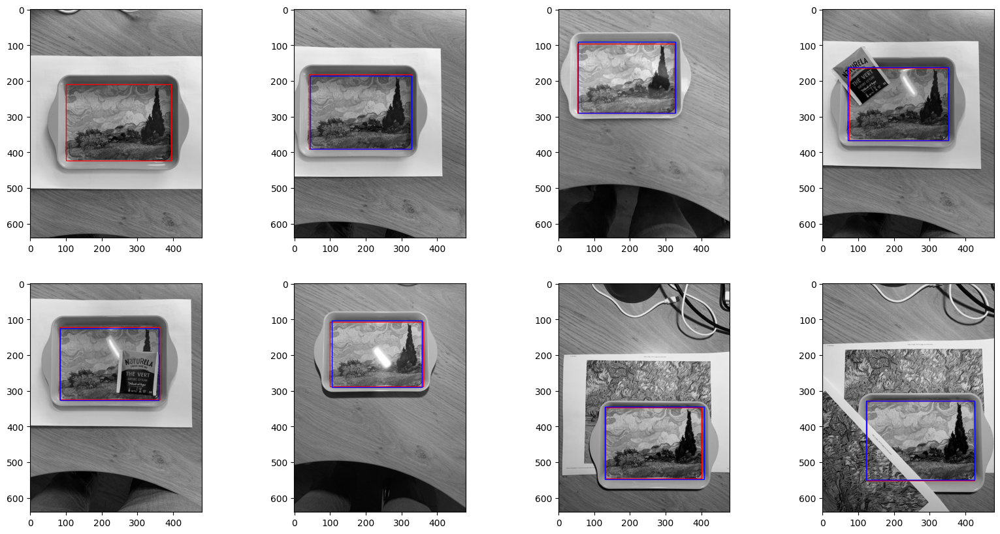

In [ ]:
def normaliser(img):
    mn, mx = img.min(), img.max()
    return (img - mn) / (mx - mn) if mx - mn > 1e-8 else img * 0.0

def rehausser_contraste(img, gamma=0.6):
    return np.power(img, gamma)

def preparer_image(img):
    return rehausser_contraste(normaliser(img.astype(float)))

def carte_harris(img, k=0.04, rayon_flou=1, sigma_flou=1):
    img = img.astype(np.float64)
    diam = 2 * rayon_flou + 1
    noyau_h = np.array([[-1, 0, +1], [-2, 0, +2], [-1, 0, +1]], dtype=np.float64)
    noyau_v = np.array([[-1, -2, -1], [0, 0, 0], [+1, +2, +1]], dtype=np.float64)
    Ix = cv2.filter2D(img, cv2.CV_64F, noyau_h)
    Iy = cv2.filter2D(img, cv2.CV_64F, noyau_v)
    if img.ndim == 3:
        Ix2  = np.sum(Ix**2,   axis=2)
        Iy2  = np.sum(Iy**2,   axis=2)
        IxIy = np.sum(Ix * Iy, axis=2)
    else:
        Ix2  = Ix**2; Iy2 = Iy**2; IxIy = Ix * Iy
    ksize = (diam, diam)
    Ix2_f  = cv2.GaussianBlur(Ix2,  ksize, sigma_flou)
    Iy2_f  = cv2.GaussianBlur(Iy2,  ksize, sigma_flou)
    IxIy_f = cv2.GaussianBlur(IxIy, ksize, sigma_flou)
    det   = Ix2_f * Iy2_f - IxIy_f**2
    trace = Ix2_f + Iy2_f
    return det - k * trace**2

def maxima_locaux(carte, rayon=1, seuil=0.5):
    H, W = carte.shape
    points = []
    for i in range(H):
        for j in range(W):
            t = max(i - rayon, 0); b = min(i + rayon, H)
            l = max(j - rayon, 0); r = min(j + rayon, W)
            voisinage_max = carte[t:b, l:r].max()
            if carte[i, j] == voisinage_max and voisinage_max > seuil:
                points.append([i, j, carte[i, j]])
    return np.array(points) if points else np.empty((0, 3))

def detecter_coins(img, seuil=0.5, k=0.04, sigma=1, rayon_flou=1, rayon_nms=1):
    R = carte_harris(img, k=k, sigma_flou=sigma, rayon_flou=rayon_flou)
    return maxima_locaux(R, rayon=rayon_nms, seuil=seuil)

def extraire_descripteurs(img, coins, rayon_patch=3):
    H, W = img.shape[:2]
    descripteurs, points_valides = [], []
    for p in coins:
        i, j = int(p[0]), int(p[1])
        if i < rayon_patch or i + rayon_patch + 1 > H: continue
        if j < rayon_patch or j + rayon_patch + 1 > W: continue
        patch = img[i-rayon_patch:i+rayon_patch+1, j-rayon_patch:j+rayon_patch+1]
        descripteurs.append(patch); points_valides.append(p)
    if not points_valides:
        return np.empty((0, 3)), np.empty((0,))
    return np.array(points_valides), np.array(descripteurs)

def meilleure_correspondance(desc, liste_desc):
    diff = liste_desc - desc
    distances = np.sum(diff**2, axis=tuple(range(1, diff.ndim)))
    return int(np.argmin(distances))

def appariement_symetrique(pts1, desc1, pts2, desc2):
    paires = []
    for i in range(len(pts1)):
        j = meilleure_correspondance(desc1[i], desc2)
        retour = meilleure_correspondance(desc2[j], desc1)
        if retour == i:
            paires.append([i, j])
    return paires

def appliquer_transform(pts, echelle, delta_ligne, delta_col):
    res = pts.copy()
    res[:, 0] = pts[:, 0] * echelle + delta_ligne
    res[:, 1] = pts[:, 1] * echelle + delta_col
    return res

def erreur_reprojection(delta_ligne, delta_col, echelle, pts_src, pts_dst):
    projetes = appliquer_transform(pts_src, echelle, delta_ligne, delta_col)
    return float(np.sum(np.sqrt(np.sum((projetes - pts_dst)**2, axis=1))))

def transformer_rectangle(rect, delta_ligne, delta_col, echelle):
    col1 = rect[0][0] * echelle + delta_col; ligne1 = rect[0][1] * echelle + delta_ligne
    col2 = rect[1][0] * echelle + delta_col; ligne2 = rect[1][1] * echelle + delta_ligne
    return [[col1, ligne1], [col2, ligne2]]

def estimer_transformation(img1, img2):
    i1 = preparer_image(img1)
    i2 = preparer_image(img2)

    coins1, desc1 = extraire_descripteurs(i1, detecter_coins(i1, seuil=0.1, sigma=0.8))
    coins2, desc2 = extraire_descripteurs(i2, detecter_coins(i2, seuil=0.1, sigma=0.8))

    if len(coins1) == 0 or len(coins2) == 0:
        return 0.0, 0.0, 1.0

    paires = appariement_symetrique(coins1, desc1, coins2, desc2)
    if not paires:
        return 0.0, 0.0, 1.0

    src = np.array([coins1[p[0]][:2] for p in paires], dtype=float)
    dst = np.array([coins2[p[1]][:2] for p in paires], dtype=float)

    #Descente de gradient pour initialiser (dl, dc, echelle)
    dl, dc, echelle = 0.0, 0.0, 1.0
    eps, pas_max_t, pas_max_s = 1e-4, 2.0, 0.01
    for _ in range(100):
        err = erreur_reprojection(dl, dc, echelle, src, dst)
        grad_dl  = (erreur_reprojection(dl+eps, dc, echelle, src, dst) - err) / eps
        grad_dc  = (erreur_reprojection(dl, dc+eps, echelle, src, dst) - err) / eps
        grad_ech = (erreur_reprojection(dl, dc, echelle+eps, src, dst) - err) / eps
        dl     += np.clip(-grad_dl,  -pas_max_t, pas_max_t)
        dc     += np.clip(-grad_dc,  -pas_max_t, pas_max_t)
        echelle += np.clip(-grad_ech, -pas_max_s, pas_max_s)

    #Filtrage des mauvaises correspondances
    residus = np.sqrt(np.sum((appliquer_transform(src, echelle, dl, dc) - dst)**2, axis=1))
    n_garder = max(4, len(src) // 2)
    meilleurs = np.argsort(residus)[:n_garder]
    src_f, dst_f = src[meilleurs], dst[meilleurs]

    n = len(src_f)
    A = np.zeros((2*n, 3)); b = np.zeros(2*n)
    for i in range(n):
        A[2*i,   0] = src_f[i, 0]; A[2*i,   1] = 1; A[2*i,   2] = 0; b[2*i]   = dst_f[i, 0]
        A[2*i+1, 0] = src_f[i, 1]; A[2*i+1, 1] = 0; A[2*i+1, 2] = 1; b[2*i+1] = dst_f[i, 1]
    resultat, _, _, _ = np.linalg.lstsq(A, b, rcond=None)
    echelle, dl, dc = resultat[0], resultat[1], resultat[2]

    return dl, dc, echelle

#Localisation du tableau dans chaque image

rect_reference = [[100, 210], [394, 424]]   # rectangle annoté manuellement sur l'image 0

rectangles = []
for i in range(1, len(vangogh)):
    dl, dc, echelle = estimer_transformation(vangogh[0], vangogh[i])
    rect = transformer_rectangle(rect_reference, dl, dc, echelle)
    rect = [[int(round(rect[0][0])), int(round(rect[0][1]))],
            [int(round(rect[1][0])), int(round(rect[1][1]))]]
    rectangles.append(rect)

show_vangogh(rectangles)


Explication de l'approche:

Pipeline

1. Préparation des images
Cela rend les gradients plus visibles et améliore la détection des coins.

2. Détection des coins (Harris)

3. Description des points

4. Mise en correspondance (matching symétrique)

5. Estimation de la transformation

On suppose une transformation simple :
- translation (dx, dy)
- changement d’échelle (scale)

Étapes :
- estimation initiale avec descente de gradient (minimisation erreur L2)
- suppression des outliers (on garde les meilleurs matches)
- raffinement avec moindres carrés

6. Transfert du rectangle

On applique la transformation aux coins du rectangle initial.

Le rectangle transformé localise le tableau dans l’image cible

On obtient de meilleurs résultats notamment sur l'image 5 où maintenant le rectangle est bien placé. Globalement, cette approche améliore tous nos résultats précédent, c'est bien plus efficace